# Dimensionality Reduction and Ordination

After preprocessing and CLR transformation, the dataset remains high-dimensional. To extract meaningful biological signals from sparse, compositional microbiome data, we employ non-linear dimensionality reduction.

### Methodological Rationale

*   **Why we bypass PCA:** Conventional PCA is explicitly discouraged for microbiome data because it assumes linear relationships and emphasizes false correlations. As [Armstrong et al. (2022)](../Papers/PCA_tsne/GeorgeAmstrong2022.pdf), *Discussion* point out, it fails to capture complex, non-linear patterns. While our CLR transformation solves the compositionality issue, forcing the high-dimensional data through a linear PCA risks stripping away critical non-linear signals before they can be visualized [Xu et al., 2020, *Introduction*](../Papers/PCA_tsne/XueliXu2020.pdf).

*   **Direct Non-Linear Embedding (t-SNE & UMAP) with Aitchison Distance**: To perfectly preserve the local structure of our data, we skip the PCA step entirely. Following the methodology of [Xu et al., 2020](../Papers/PCA_tsne/XueliXu2020.pdf), we compute the Aitchison distance (mathematically equivalent to the Euclidean distance on CLR-transformed data) across all features and feed it directly into the t-SNE and UMAP algorithms. Non-linear methods like t-SNE and UMAP are uniquely capable of revealing biological fine-scale clusters hidden from linear methods [Armstrong et al. (2022)](../Papers/PCA_tsne/GeorgeAmstrong2022.pdf). As [Xu et al., 2020](../Papers/PCA_tsne/XueliXu2020.pdf) demonstrated, bypassing linear pre-filters and applying the Aitchison distance directly to both algorithms ensures they accurately handle the compositionality of the data, leading to superior representations.

### From Geography to Global Signatures

Plotting individual countries often creates visual noise. To make the ordination interpretable, we aggregate the samples into broader socio-ecological groupings:
*   **Continents:** To identify large-scale biogeographical patterns.
*   **Lifestyle Clusters (Western vs. Non-Western):** To evaluate how industrialization and diet shape the microbial fingerprint.

### Implementation

1.  Compute the high-dimensional **Aitchison distance** directly from all CLR-transformed features (bypassing PCA).
2.  Execute **t-SNE** on this complete distance matrix to visualize non-linear structures in 2D.
3.  Evaluate the resulting clusters based on Geography and Lifestyle categories.

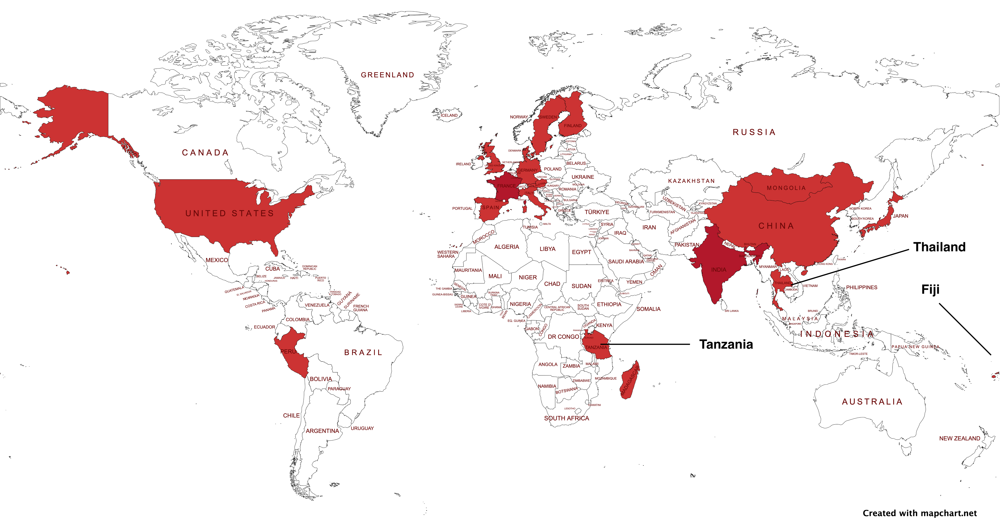

In [1]:
from IPython.display import Image
# Show png of world map in data folder here for better visualization of the task
Image(filename='../data/processed/world_map.png')

In [2]:
#IMPORTS
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
import umap
from sklearn.manifold import TSNE

In [3]:
# Load the CLR-transformed dataset
file_path = '../data/processed/06_clr_healthy_data.csv'
df = pd.read_csv(file_path)

# Feature selection and label extraction
features = [col for col in df.columns if col.startswith('msp')]
X = df[features]
labels = df['Geography']

In [4]:
# t-SNE: local neighborhood structure
tsne = TSNE(n_components=2, perplexity=30, init='pca', random_state=42)
X_tsne = tsne.fit_transform(X)

# UMAP: balanced global + local structure
reducer = umap.UMAP(n_neighbors=15, min_dist=0.1, n_components=2, random_state=42)
X_umap = reducer.fit_transform(X)

df_plot = pd.DataFrame({
    'tsne_1': X_tsne[:, 0],
    'tsne_2': X_tsne[:, 1],
    'umap_1': X_umap[:, 0],
    'umap_2': X_umap[:, 1],
    'Geography': labels.values,
})

/Users/dario/ZHAW/4.Semester/PA1_repo/.venv/lib/python3.13/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


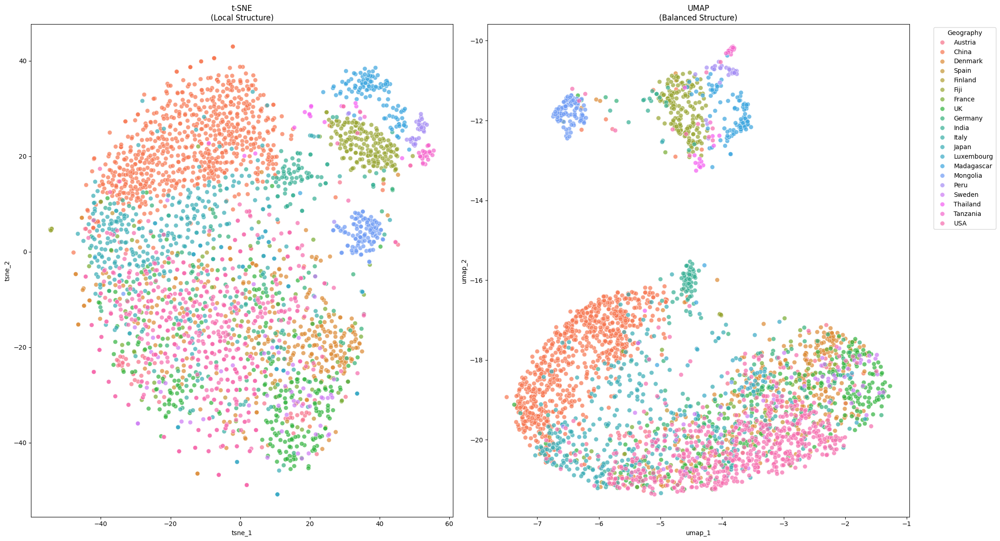

In [5]:
# Visualization: Side-by-side Comparison
fig, axes = plt.subplots(1, 2, figsize=(22, 12))

# Plot t-SNE
sns.scatterplot(data=df_plot, x='tsne_1', y='tsne_2', hue='Geography', ax=axes[0], palette='husl', s=50, alpha=0.7)
axes[0].set_title('t-SNE\n(Local Structure)')
axes[0].get_legend().remove()

# Plot UMAP
sns.scatterplot(data=df_plot, x='umap_1', y='umap_2', hue='Geography', ax=axes[1], palette='husl', s=50, alpha=0.7)
axes[1].set_title('UMAP\n(Balanced Structure)')
axes[1].legend(bbox_to_anchor=(1.05, 1), loc='upper left', title='Geography')

plt.tight_layout()
plt.show()

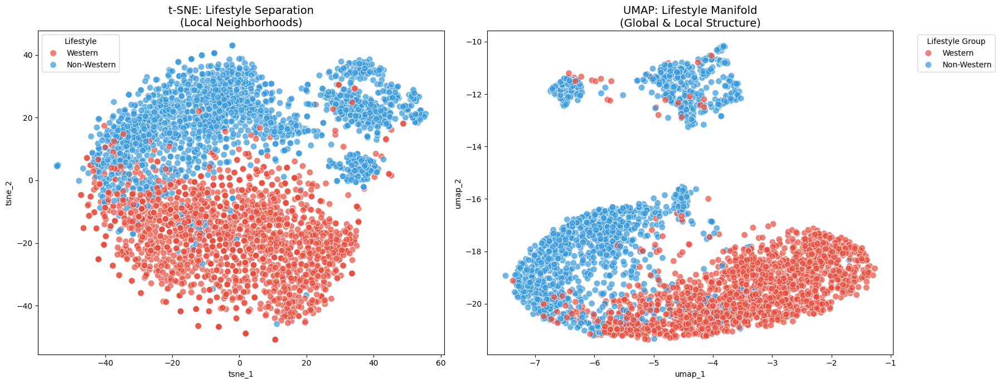

In [6]:
# Lifestyle mapping (Western vs. Non-Western)
lifestyle_map = {
    'Austria': 'Western', 'Denmark': 'Western', 'France': 'Western', 'Germany': 'Western',
    'Italy': 'Western', 'Luxembourg': 'Western', 'Spain': 'Western', 'Sweden': 'Western',
    'UK': 'Western', 'USA': 'Western',
    'China': 'Non-Western', 'India': 'Non-Western', 'Japan': 'Non-Western',
    'Mongolia': 'Non-Western', 'Thailand': 'Non-Western', 'Madagascar': 'Non-Western',
    'Tanzania': 'Non-Western', 'Peru': 'Non-Western', 'Fiji': 'Non-Western'
}

df_plot['Lifestyle'] = df_plot['Geography'].map(lifestyle_map)

# Visualization: hard contrast (Red = Western, Blue = Non-Western)
fig, axes = plt.subplots(1, 2, figsize=(18, 7))
lifestyle_palette = {'Western': '#e74c3c', 'Non-Western': '#3498db'}

sns.scatterplot(data=df_plot, x='tsne_1', y='tsne_2', hue='Lifestyle',
                ax=axes[0], palette=lifestyle_palette, s=70, alpha=0.7)
axes[0].set_title('t-SNE: Lifestyle Separation\n(Local Neighborhoods)', fontsize=14)

sns.scatterplot(data=df_plot, x='umap_1', y='umap_2', hue='Lifestyle',
                ax=axes[1], palette=lifestyle_palette, s=70, alpha=0.7)
axes[1].set_title('UMAP: Lifestyle Manifold\n(Global & Local Structure)', fontsize=14)
axes[1].legend(bbox_to_anchor=(1.05, 1), loc='upper left', title='Lifestyle Group')

plt.tight_layout()
plt.show()

### Grouped by life expectancy

https://www.worldometers.info/demographics/life-expectancy/

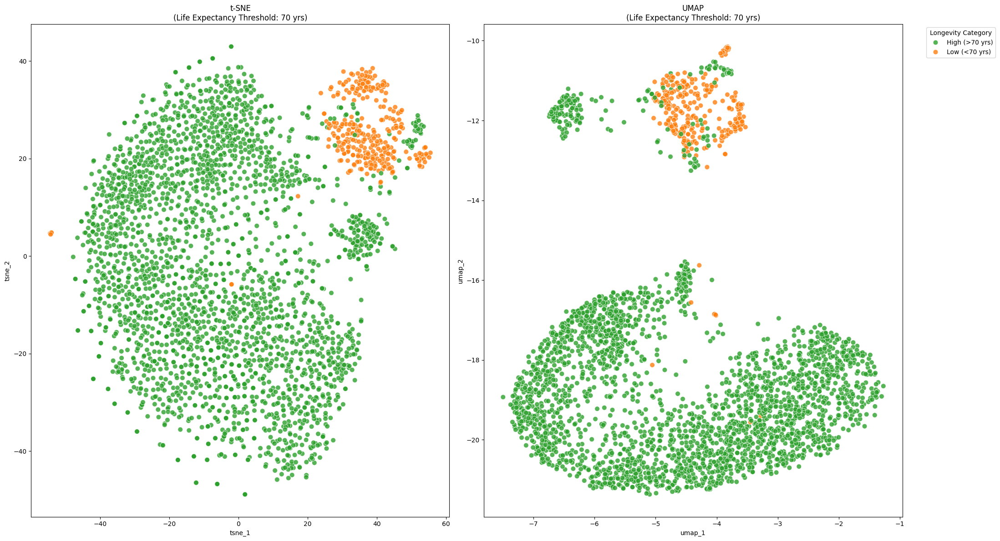

In [7]:
# Life expectancy in years per country (WHO / World Bank latest estimates)
life_expectancy_raw = {
    'Japan': 85.2, 'Spain': 84.1, 'Sweden': 83.7, 'Italy': 84.2,
    'France': 83.7, 'Luxemburg': 82.6, 'Finland': 82.4, 'Austria': 82.5,
    'Denmark': 82.4, 'Germany': 81.9, 'UK': 81.8,
    'USA': 79.8, 'China': 79, 'Thailand': 77.1, 'Peru': 78.3,
    'Mongolia': 72.5, 'India': 72.7,
    'Fiji': 67.8, 'Tanzania': 67.6, 'Madagascar': 64.3
}

# Threshold for High vs. Low classification
age_threshold = 70

life_expectancy_binary = {
    country: f'High (>{age_threshold} yrs)' if val >= age_threshold else f'Low (<{age_threshold} yrs)'
    for country, val in life_expectancy_raw.items()
}

df_plot['Life_Status'] = df_plot['Geography'].map(life_expectancy_binary)

fig, axes = plt.subplots(1, 2, figsize=(22, 12))
palette_colors = {
    f'High (>{age_threshold} yrs)': '#2ca02c',
    f'Low (<{age_threshold} yrs)': '#ff7f0e'
}

sns.scatterplot(data=df_plot, x='tsne_1', y='tsne_2', hue='Life_Status',
                ax=axes[0], palette=palette_colors, s=60, alpha=0.8, edgecolor='white')
axes[0].set_title(f't-SNE\n(Life Expectancy Threshold: {age_threshold} yrs)')
axes[0].get_legend().remove()

sns.scatterplot(data=df_plot, x='umap_1', y='umap_2', hue='Life_Status',
                ax=axes[1], palette=palette_colors, s=60, alpha=0.8, edgecolor='white')
axes[1].set_title(f'UMAP\n(Life Expectancy Threshold: {age_threshold} yrs)')
axes[1].legend(bbox_to_anchor=(1.05, 1), loc='upper left', title='Longevity Category')

plt.tight_layout()
plt.show()

### Grouped by developing countries

https://www.worlddata.info/developing-countries.php

There are differences between modern countries and developing countries, which could explain illnesses like high asthma prevalence (https://pmc.ncbi.nlm.nih.gov/articles/PMC10793171/)

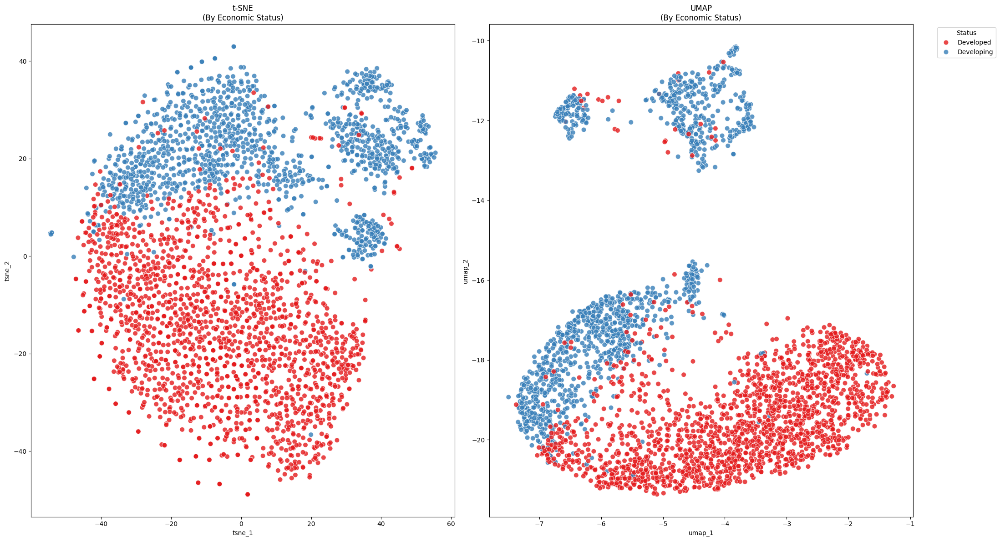

In [8]:
# Geography -> Development status (UN / World Bank classifications)
development_status_map = {
    'USA': 'Developed', 'UK': 'Developed', 'Germany': 'Developed',
    'France': 'Developed', 'Spain': 'Developed', 'Italy': 'Developed',
    'Austria': 'Developed', 'Denmark': 'Developed', 'Finland': 'Developed',
    'Luxemburg': 'Developed', 'Sweden': 'Developed', 'Japan': 'Developed',
    'China': 'Developing', 'India': 'Developing', 'Thailand': 'Developing',
    'Peru': 'Developing', 'Fiji': 'Developing', 'Mongolia': 'Developing',
    'Tanzania': 'Developing', 'Madagascar': 'Developing'
}

df_plot['Economy_Status'] = df_plot['Geography'].map(development_status_map)

fig, axes = plt.subplots(1, 2, figsize=(22, 12))
status_order = ['Developed', 'Developing']

sns.scatterplot(data=df_plot, x='tsne_1', y='tsne_2', hue='Economy_Status',
                hue_order=status_order, ax=axes[0], palette='Set1', s=60, alpha=0.8)
axes[0].set_title('t-SNE\n(By Economic Status)')
axes[0].get_legend().remove()

sns.scatterplot(data=df_plot, x='umap_1', y='umap_2', hue='Economy_Status',
                hue_order=status_order, ax=axes[1], palette='Set1', s=60, alpha=0.8)
axes[1].set_title('UMAP\n(By Economic Status)')
axes[1].legend(bbox_to_anchor=(1.05, 1), loc='upper left', title='Status')

plt.tight_layout()
plt.show()

### Grouped by lactase persistence

https://worldpopulationreview.com/country-rankings/lactose-intolerance-by-country

Belgium and Netherlands have both 85% persistance -> Luxemburg will be catgorized into this with 85%

Peru has high lactase intolerance, number above is approx (https://pmc.ncbi.nlm.nih.gov/articles/PMC8493957/#S4)

Fiji and Madagascar are considered low (https://pmc.ncbi.nlm.nih.gov/articles/PMC2834688/)

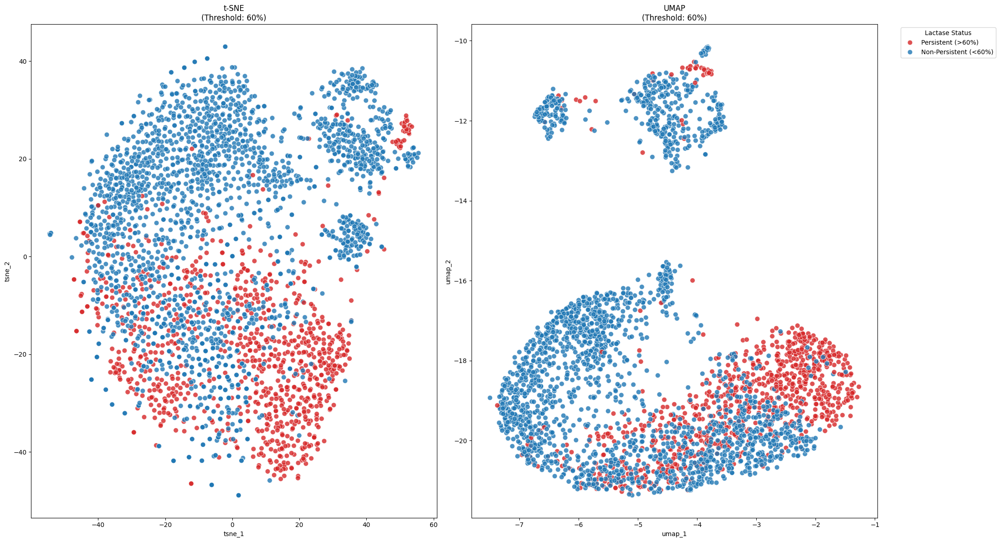

In [9]:
# Lactase persistence (%) per country (Itan et al. 2010 / global meta-analyses)
persistence_data = {
    'Denmark': 86, 'Sweden': 73, 'UK': 82, 'Finland': 76,
    'Germany': 85, 'Austria': 80, 'Luxemburg': 85, 'France': 63,
    'Spain': 80, 'USA': 48, 'Italy': 28, 'India': 41,
    'Tanzania': 48, 'China': 15, 'Japan': 28, 'Thailand': 22,
    'Mongolia': 12, 'Peru': 80, 'Fiji': 15, 'Madagascar': 15
}

# Threshold for Persistent vs. Non-Persistent
threshold = 60

lactase_binary_map = {
    country: f'Persistent (>{threshold}%)' if val >= threshold else f'Non-Persistent (<{threshold}%)'
    for country, val in persistence_data.items()
}

df_plot['Lactase_Status'] = df_plot['Geography'].map(lactase_binary_map)

fig, axes = plt.subplots(1, 2, figsize=(22, 12))
palette_colors = {
    f'Persistent (>{threshold}%)': 'tab:red',
    f'Non-Persistent (<{threshold}%)': 'tab:blue'
}

sns.scatterplot(data=df_plot, x='tsne_1', y='tsne_2', hue='Lactase_Status',
                ax=axes[0], palette=palette_colors, s=60, alpha=0.8, edgecolor='white')
axes[0].set_title(f't-SNE\n(Threshold: {threshold}%)')
axes[0].get_legend().remove()

sns.scatterplot(data=df_plot, x='umap_1', y='umap_2', hue='Lactase_Status',
                ax=axes[1], palette=palette_colors, s=60, alpha=0.8, edgecolor='white')
axes[1].set_title(f'UMAP\n(Threshold: {threshold}%)')
axes[1].legend(bbox_to_anchor=(1.05, 1), loc='upper left', title='Lactase Status')

plt.tight_layout()
plt.show()

### Meat consumption 2022

https://worldpopulationreview.com/country-rankings/meat-consumption-by-country

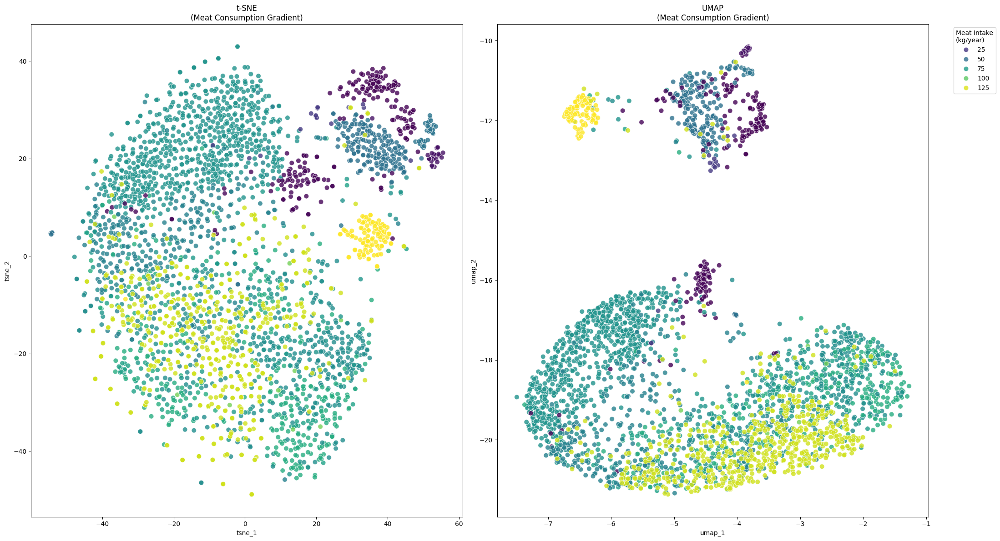

In [10]:
# Meat consumption (kg/capita/year) per country (UN FAO / Our World in Data)
meat_consumption = {
    'Denmark': 67.03, 'Sweden': 68.03, 'UK': 84.08, 'Finland': 71.62,
    'Germany': 71.32, 'Austria': 77.96, 'Luxemburg': 86.06, 'France': 84.6,
    'Spain': 104.76, 'USA': 122.8, 'Italy': 73.58, 'India': 6.63,
    'Tanzania': 11.79, 'China': 70.57, 'Japan': 60.42, 'Thailand': 25.93,
    'Mongolia': 131.78, 'Peru': 54.28, 'Fiji': 51.9, 'Madagascar': 5.49
}

df_plot['Meat_Consumption_kg'] = df_plot['Geography'].map(meat_consumption)

fig, axes = plt.subplots(1, 2, figsize=(22, 12))

sns.scatterplot(data=df_plot, x='tsne_1', y='tsne_2', hue='Meat_Consumption_kg',
                ax=axes[0], palette='viridis', s=60, alpha=0.8, edgecolor='white')
axes[0].set_title('t-SNE\n(Meat Consumption Gradient)')
axes[0].get_legend().remove()

sns.scatterplot(data=df_plot, x='umap_1', y='umap_2', hue='Meat_Consumption_kg',
                ax=axes[1], palette='viridis', s=60, alpha=0.8, edgecolor='white')
axes[1].set_title('UMAP\n(Meat Consumption Gradient)')
axes[1].legend(bbox_to_anchor=(1.05, 1), loc='upper left', title='Meat Intake\n(kg/year)')

plt.tight_layout()
plt.show()

### Sugar consumption 2022

https://worldpopulationreview.com/country-rankings/sugar-consumption-by-country

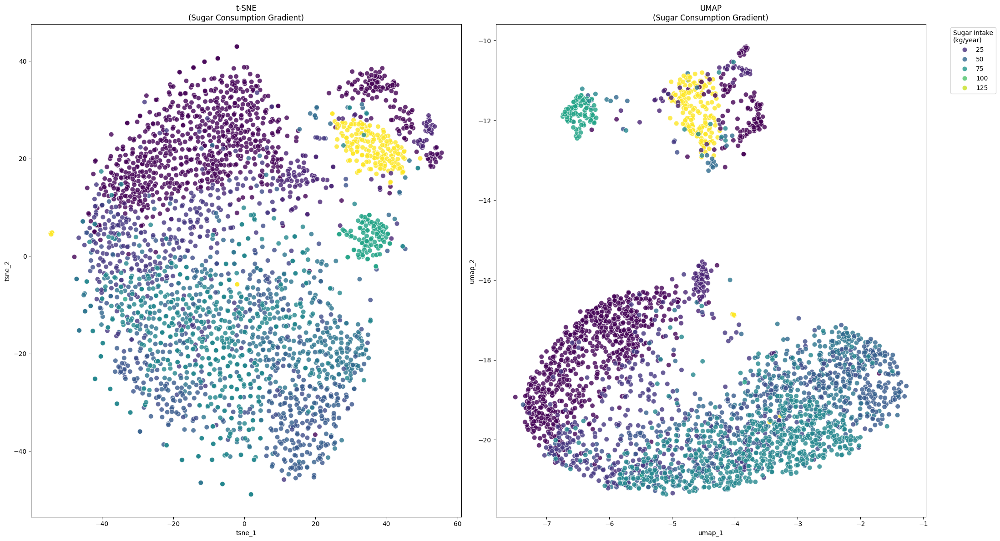

In [11]:
# Sugar consumption (kg/capita/year) per country
sugar_consumption = {
    'Denmark': 57.09, 'Sweden': 46.58, 'UK': 43.8, 'Finland': 49.81,
    'Germany': 50.1, 'Austria': 41.31, 'Luxemburg': 166.15, 'France': 37.06,
    'Spain': 34.41, 'USA': 67.1, 'Italy': 37.45, 'India': 20.13,
    'Tanzania': 11.0, 'China': 9.04, 'Japan': 28.5, 'Thailand': 51.99,
    'Mongolia': 82.11, 'Peru': 20.16, 'Fiji': 135.7, 'Madagascar': 8.07
}

df_plot['Sugar_Consumption_kg'] = df_plot['Geography'].map(sugar_consumption)

fig, axes = plt.subplots(1, 2, figsize=(22, 12))

sns.scatterplot(data=df_plot, x='tsne_1', y='tsne_2', hue='Sugar_Consumption_kg',
                ax=axes[0], palette='viridis', s=60, alpha=0.8, edgecolor='white')
axes[0].set_title('t-SNE\n(Sugar Consumption Gradient)')
axes[0].get_legend().remove()

sns.scatterplot(data=df_plot, x='umap_1', y='umap_2', hue='Sugar_Consumption_kg',
                ax=axes[1], palette='viridis', s=60, alpha=0.8, edgecolor='white')
axes[1].set_title('UMAP\n(Sugar Consumption Gradient)')
axes[1].legend(bbox_to_anchor=(1.05, 1), loc='upper left', title='Sugar Intake\n(kg/year)')

plt.tight_layout()
plt.show()

### BMI signature within the USA

The USA has the largest sample representation in this dataset, which makes it the natural choice for examining whether body composition (proxied by BMI) leaves a detectable microbiome signature *within* a single, lifestyle-homogeneous population. Mixing it back into the global embedding would let country-level structure dominate, so we recompute t-SNE and UMAP on the USA-only subset.

BMI groups follow standard WHO cut-offs:
*   **Normal**: BMI < 25
*   **Overweight**: 25 ≤ BMI < 30
*   **Obese**: BMI ≥ 30

Samples with missing BMI are dropped before grouping.

In [12]:
# Filter to USA samples and drop rows with missing BMI
df_usa = df[df['Geography'] == 'USA'].copy()
df_usa = df_usa.dropna(subset=['BMI'])

# Categorize BMI into Normal / Overweight / Obese (WHO cut-offs)
bmi_bins = [-np.inf, 25, 30, np.inf]
bmi_labels = ['Normal', 'Overweight', 'Obese']
df_usa['BMI_Category'] = pd.cut(df_usa['BMI'], bins=bmi_bins, labels=bmi_labels, right=False)

print(f"USA samples after filtering: {len(df_usa)}")
print(df_usa['BMI_Category'].value_counts())

USA samples after filtering: 499
BMI_Category
Normal        285
Overweight    147
Obese          67
Name: count, dtype: int64


In [13]:
# Recompute embeddings on the USA-only subset
X_usa = df_usa[features]

tsne_usa = TSNE(n_components=2, perplexity=30, init='pca', random_state=42)
X_tsne_usa = tsne_usa.fit_transform(X_usa)

reducer_usa = umap.UMAP(n_neighbors=15, min_dist=0.1, n_components=2, random_state=42)
X_umap_usa = reducer_usa.fit_transform(X_usa)

df_usa_plot = pd.DataFrame({
    'tsne_1': X_tsne_usa[:, 0],
    'tsne_2': X_tsne_usa[:, 1],
    'umap_1': X_umap_usa[:, 0],
    'umap_2': X_umap_usa[:, 1],
    'BMI_Category': df_usa['BMI_Category'].values,
})

/Users/dario/ZHAW/4.Semester/PA1_repo/.venv/lib/python3.13/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


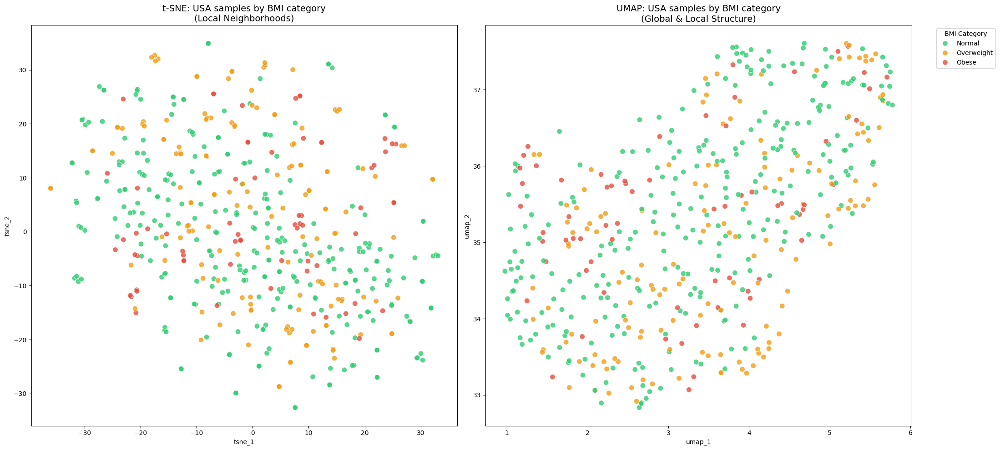

In [14]:
# Visualization: USA-only embedding colored by BMI category
fig, axes = plt.subplots(1, 2, figsize=(22, 10))

bmi_palette = {'Normal': '#2ecc71', 'Overweight': '#f39c12', 'Obese': '#e74c3c'}
bmi_order = ['Normal', 'Overweight', 'Obese']

sns.scatterplot(data=df_usa_plot, x='tsne_1', y='tsne_2', hue='BMI_Category',
                hue_order=bmi_order, ax=axes[0], palette=bmi_palette,
                s=70, alpha=0.8, edgecolor='white')
axes[0].set_title('t-SNE: USA samples by BMI category\n(Local Neighborhoods)', fontsize=14)
axes[0].get_legend().remove()

sns.scatterplot(data=df_usa_plot, x='umap_1', y='umap_2', hue='BMI_Category',
                hue_order=bmi_order, ax=axes[1], palette=bmi_palette,
                s=70, alpha=0.8, edgecolor='white')
axes[1].set_title('UMAP: USA samples by BMI category\n(Global & Local Structure)', fontsize=14)
axes[1].legend(bbox_to_anchor=(1.05, 1), loc='upper left', title='BMI Category')

plt.tight_layout()
plt.show()

In [15]:
# Persist the filtered + grouped dataframe for downstream notebooks
output_path = '../data/processed/07_bmi_filtered_USA_data.csv'
df_usa.to_csv(output_path, index=False)


### BMI extremes within the USA (tail contrast)

The three-way Normal/Overweight/Obese embedding showed no separable structure, which is consistent with literature: within a single population, microbiome shifts associated with BMI are typically subtle and dominated by inter-individual variation across the full ~1000 features. Mixing the ambiguous middle of the BMI distribution into a three-way contrast dilutes any real signal further.

To maximise effect size for downstream supervised learning, we restrict the analysis to the tails of the BMI distribution:

*   **Lean** — BMI < 22
*   **Obese** — BMI > 35

Samples with 22 ≤ BMI ≤ 35 are discarded for this analysis. The resulting filtered dataframe is persisted to `07_extreme_bmi_data.csv` for use in the ML notebook (`05_BMI_extremes_ml.ipynb`).

In [16]:
# Filter USA samples to the BMI tails (Lean < 22, Obese > 35)
df_extreme = df[df['Geography'] == 'USA'].copy()
df_extreme = df_extreme.dropna(subset=['BMI'])

lean_mask = df_extreme['BMI'] < 22
obese_mask = df_extreme['BMI'] > 32
df_extreme = df_extreme[lean_mask | obese_mask].copy()

df_extreme['BMI_Extreme'] = np.where(df_extreme['BMI'] < 22, 'Lean', 'Obese')

print(f"Extreme-BMI USA samples: {len(df_extreme)}")
print(df_extreme['BMI_Extreme'].value_counts())

Extreme-BMI USA samples: 142
BMI_Extreme
Lean     119
Obese     23
Name: count, dtype: int64


In [17]:
# Persist the filtered dataframe for the ML notebook
output_path = '../data/processed/08_extreme_bmi_data.csv'
df_extreme.to_csv(output_path, index=False)
print(f"Saved extreme-BMI dataframe to: {output_path}")
print(f"Shape: {df_extreme.shape}")

Saved extreme-BMI dataframe to: ../data/processed/08_extreme_bmi_data.csv
Shape: (142, 610)


In [18]:
# Recompute t-SNE and UMAP on the extreme-BMI subset only
X_extreme = df_extreme[features]

tsne_extreme = TSNE(n_components=2, perplexity=20, init='pca', random_state=42)
X_tsne_extreme = tsne_extreme.fit_transform(X_extreme)

reducer_extreme = umap.UMAP(n_neighbors=20, min_dist=0.1, n_components=2, random_state=42)
X_umap_extreme = reducer_extreme.fit_transform(X_extreme)

df_extreme_plot = pd.DataFrame({
    'tsne_1': X_tsne_extreme[:, 0],
    'tsne_2': X_tsne_extreme[:, 1],
    'umap_1': X_umap_extreme[:, 0],
    'umap_2': X_umap_extreme[:, 1],
    'BMI_Extreme': df_extreme['BMI_Extreme'].values,
})

/Users/dario/ZHAW/4.Semester/PA1_repo/.venv/lib/python3.13/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


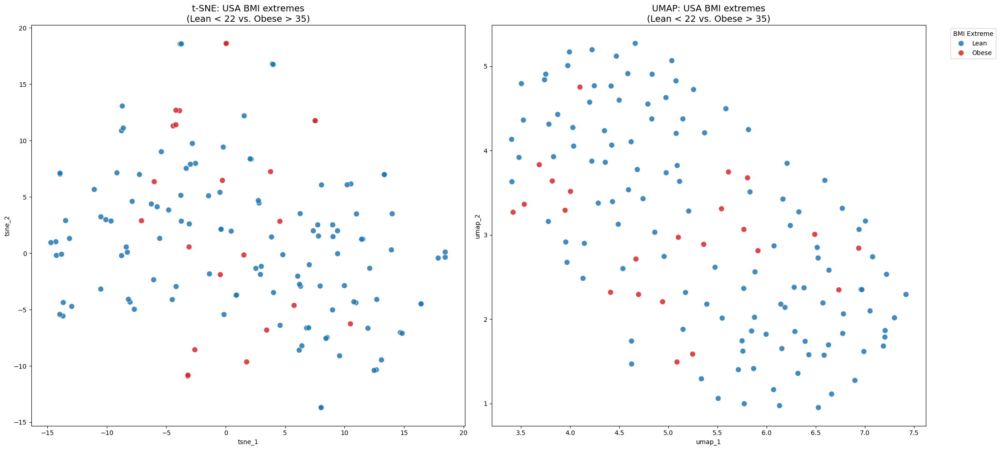

In [19]:
# Visualization: extreme-BMI embedding (Lean vs. Obese)
fig, axes = plt.subplots(1, 2, figsize=(22, 10))

extreme_palette = {'Lean': '#1f77b4', 'Obese': '#d62728'}
extreme_order = ['Lean', 'Obese']

sns.scatterplot(data=df_extreme_plot, x='tsne_1', y='tsne_2', hue='BMI_Extreme',
                hue_order=extreme_order, ax=axes[0], palette=extreme_palette,
                s=80, alpha=0.85, edgecolor='white')
axes[0].set_title('t-SNE: USA BMI extremes\n(Lean < 22 vs. Obese > 35)', fontsize=14)
axes[0].get_legend().remove()

sns.scatterplot(data=df_extreme_plot, x='umap_1', y='umap_2', hue='BMI_Extreme',
                hue_order=extreme_order, ax=axes[1], palette=extreme_palette,
                s=80, alpha=0.85, edgecolor='white')
axes[1].set_title('UMAP: USA BMI extremes\n(Lean < 22 vs. Obese > 35)', fontsize=14)
axes[1].legend(bbox_to_anchor=(1.05, 1), loc='upper left', title='BMI Extreme')

plt.tight_layout()
plt.show()